**1.Correlation**

(a) Write a program to perform spatial filtering (i.e., correlation) of an image. Both the size of the mask and its values (i.e., weights) need to be variables that can be input into your program.

Enter the mask size : 3
Enter values for row 1 separated by spaces: 1 2 1
Enter values for row 2 separated by spaces: 2 4 2
Enter values for row 3 separated by spaces: 1 2 1
Filtered image saved as 'filtered_image.pgm'.


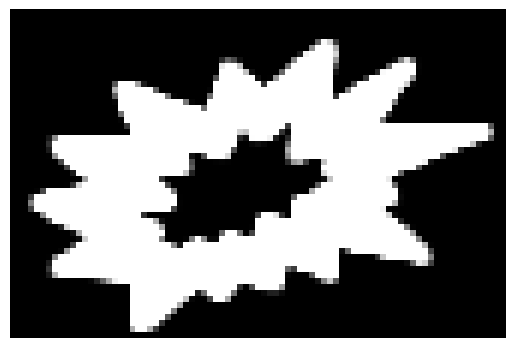

In [1]:
#Import the required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to skip comments in the PGM file
def skip_comments(file):
    line = file.readline().decode("utf-8").strip()
    while line.startswith("#"):
        line = file.readline().decode("utf-8").strip()
    return line

# Load the image
with open('pattern.pgm', 'rb') as file:
    header = skip_comments(file)
    if header != 'P5':
        print("Error: Invalid image format (only PGM P5 format is supported).")
    else:
        # Read the image dimensions and maximum pixel value
        width, height = map(int, skip_comments(file).split())
        max_pixel_value = int(skip_comments(file))

        # Read the image data
        image_data = bytearray(file.read())

        # Check if the image was loaded successfully
        if image_data is None:
            print("Error: Could not load the image.")
        else:
            # Define the size and values of the filter mask
            while True:
                try:
                    mask_size = int(input("Enter the mask size : "))
                    if mask_size % 2 == 1:
                        break  # Exit the loop if the input is a valid odd integer
                    else:
                        print("Mask size should be an odd integer.")
                except ValueError:
                    print("Invalid input. Please enter an integer.")

            mask_values = []
            for i in range(mask_size):
                row = input(f"Enter values for row {i+1} separated by spaces: ").split()
                mask_values.append([float(val) for val in row])

            # Convert the mask_values list into a list of lists
            mask = [list(map(float, row)) for row in mask_values]

            # Get the dimensions of the image
            height, width = height, width

            # Calculate padding based on the mask size
            padding = mask_size // 2

            # Create a new image to store the filtered result
            filtered_image_data = bytearray(image_data)

            # Perform spatial filtering (correlation)
            for y in range(padding, height - padding):
                for x in range(padding, width - padding):
                    # Extract the neighborhood of the current pixel
                    neighborhood = [
                        image_data[(y - padding + j) * width + (x - padding + i)]
                        for j in range(mask_size)
                        for i in range(mask_size)
                    ]

                    # Perform correlation between the neighborhood and the mask
                    result = sum(neighborhood[i] * mask[i // mask_size][i % mask_size] for i in range(mask_size * mask_size))

                    # Set the result in the filtered image
                    filtered_image_data[y * width + x] = int(min(max(result, 0), max_pixel_value))

            # Save the filtered image
            with open('filtered_image.pgm', 'wb') as output_file:
                output_file.write(f'P5\n{width} {height}\n{max_pixel_value}\n'.encode())
                output_file.write(filtered_image_data)

            print("Filtered image saved as 'filtered_image.pgm'.")

            # Display the filtered image using Matplotlib
            filtered_image = mpimg.imread('filtered_image.pgm')
            plt.imshow(filtered_image, cmap='gray')
            plt.axis('off')
            plt.show()

(b) Test your program by computing the correlation between the two images below (can be downloaded from the course’s webpage). Use the left image to define the weights of the mask.

Enter the mask size (e.g., 3 for a 3x3 mask): 3
Enter values for row 1 separated by spaces: 1 2 1
Enter values for row 2 separated by spaces: 2 4 2
Enter values for row 3 separated by spaces: 1 2 1


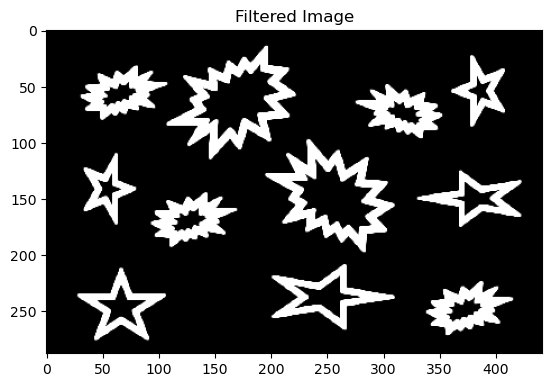

In [2]:
# Load the required libraries
import matplotlib.pyplot as plt

# Load the mask image (left image for defining mask weights)
mask_image = plt.imread('Pattern.pgm')

# Load the target image
target_image = plt.imread('Image.pgm')

# Check if the images were loaded successfully
if mask_image is None or target_image is None:
    print("Error: Could not load one or both of the images.")
else:
    # Define the size and values of the filter mask
    while True:
        try:
            mask_size = int(input("Enter the mask size (e.g., 3 for a 3x3 mask): "))
            if mask_size % 2 == 1:
                break  # Exit the loop if the input is a valid odd integer
            else:
                print("Mask size should be an odd integer.")
        except ValueError:
            print("Invalid input. Please enter an integer.")

    mask_values = []
    for i in range(mask_size):
        row = input(f"Enter values for row {i+1} separated by spaces: ").split()
        mask_values.append([float(val) for val in row])

    # Get the dimensions of the mask image
    mask_height, mask_width = mask_image.shape

    # Get the dimensions of the target image
    target_height, target_width = target_image.shape

    # Calculate padding based on the mask size
    padding = mask_size // 2

    # Create a new image to store the filtered result
    filtered_image = [[0 for _ in range(target_width)] for _ in range(target_height)]

    # Perform spatial filtering (correlation)
    for y in range(padding, target_height - padding):
        for x in range(padding, target_width - padding):
            # Extract the neighborhood of the current pixel from the target image
            neighborhood = target_image[y - padding:y + padding + 1, x - padding:x + padding + 1]

            # Perform correlation between the neighborhood and the mask
            result = 0
            for i in range(mask_size):
                for j in range(mask_size):
                    result += neighborhood[i, j] * mask_values[i][j]

            # Set the result in the filtered image
            filtered_image[y][x] = int(max(0, min(255, result)))

    # Display the filtered image
    plt.imshow(filtered_image, cmap='gray', vmin=0, vmax=255)
    plt.title('Filtered Image')
    plt.show()

(c) Show and discuss your results (i.e., visualize the results of correlation as an image, e.g., scale the values in [0, 255] and store them in PGM format). How could you use the results of correlation to find the location(s) of the pattern shown (i.e., left image) in the right image? Explain.

Pattern found at coordinates (x=26, y=27) with dimensions (h=55, w=83)
Pattern found at coordinates (x=27, y=27) with dimensions (h=55, w=83)
Pattern found at coordinates (x=28, y=27) with dimensions (h=55, w=83)
Pattern found at coordinates (x=29, y=27) with dimensions (h=55, w=83)
Pattern found at coordinates (x=26, y=28) with dimensions (h=55, w=83)
Pattern found at coordinates (x=27, y=28) with dimensions (h=55, w=83)
Pattern found at coordinates (x=28, y=28) with dimensions (h=55, w=83)
Pattern found at coordinates (x=29, y=28) with dimensions (h=55, w=83)
Pattern found at coordinates (x=27, y=29) with dimensions (h=55, w=83)
Pattern found at coordinates (x=89, y=139) with dimensions (h=55, w=83)
Pattern found at coordinates (x=90, y=139) with dimensions (h=55, w=83)
Pattern found at coordinates (x=88, y=140) with dimensions (h=55, w=83)
Pattern found at coordinates (x=89, y=140) with dimensions (h=55, w=83)
Pattern found at coordinates (x=90, y=140) with dimensions (h=55, w=83)
P

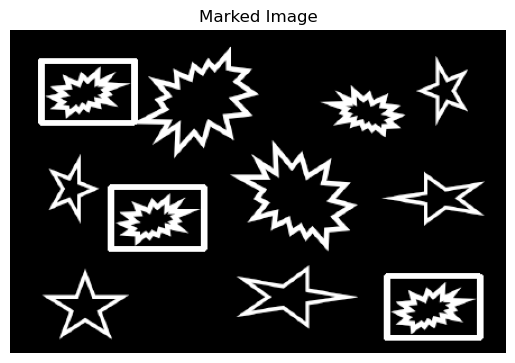

In [3]:
# Load the required libraries
import cv2
import matplotlib.pyplot as plt

# Load the pattern and image
pattern_image = cv2.imread('Pattern.pgm', cv2.IMREAD_GRAYSCALE)
image_image = cv2.imread('Image.pgm', cv2.IMREAD_GRAYSCALE)

# Perform template matching
result = cv2.matchTemplate(image_image, pattern_image, cv2.TM_CCOEFF_NORMED)

# Define a threshold to consider a match
threshold = 0.8

# Find the coordinates where the pattern is found
locations = []

height, width = result.shape
for y in range(height):
    for x in range(width):
        if result[y, x] >= threshold:
            locations.append((x, y))

if locations:
    for location in locations:
        x, y = location
        h, w = pattern_image.shape
        print(f"Pattern found at coordinates (x={x}, y={y}) with dimensions (h={h}, w={w})")
        cv2.rectangle(image_image, (x, y), (x + w, y + h), 255, 2)  # Draw a rectangle

    # Save the marked image
    cv2.imwrite('marked_image.pgm', image_image)

    # Display the marked image using matplotlib
    plt.imshow(cv2.cvtColor(image_image, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title("Marked Image")
    plt.axis('off')
    plt.show()
else:
    print("Pattern not found in the Image.pgm image.")


**2.Averaging and Gaussian Smoothing**

(a) Smooth the “lenna” and “sf” images using (1) 7x7 and 15x15 averaging filters and (2) 7x7 and 15x15 Gaussian filters (using the masks provided below). You should normalize the mask weights so they sum to one.

In [4]:
# Function to create a 2D Gaussian filter mask
def create_gaussian_mask(size, sigma):
    mask = [[0] * size for _ in range(size)]  # Create an empty 2D mask
    mask_radius = size // 2  # Calculate the radius of the mask
    sigma_squared = sigma * sigma  # Calculate the square of sigma
    sum_weights = 0  # Initialize the sum of mask weights

    # Loop to fill the mask with Gaussian weights
    for x in range(-mask_radius, mask_radius + 1):
        for y in range(-mask_radius, mask_radius + 1):
            weight = 2.71828 ** (-(x ** 2 + y ** 2) / (2 * sigma_squared))  # Calculate Gaussian weight
            mask[x + mask_radius][y + mask_radius] = weight  # Assign the weight to the mask
            sum_weights += weight  # Update the sum of weights

    # Normalize the mask so that weights sum to one
    for i in range(size):
        for j in range(size):
            mask[i][j] /= sum_weights  # Divide each weight by the sum of weights

    return mask

# Function to apply average filtering to smooth the grayscale images
def apply_average_filter(image, mask, width, height):
    mask_size = len(mask)
    mask_radius = mask_size // 2
    smoothed_image = [0] * (width * height)  # Create an empty array for the smoothed image

    # Loop through the image to apply the filter
    for x in range(mask_radius, height - mask_radius):
        for y in range(mask_radius, width - mask_radius):
            pixel_value = 0  # Initialize the pixel value accumulator
            for i in range(mask_size):
                for j in range(mask_size):
                    px, py = x + i - mask_radius, y + j - mask_radius  # Calculate pixel coordinates
                    mask_value = mask[i][j]  # Get the corresponding mask value
                    pixel_value += image[px * width + py] * mask_value  # Add weighted pixel value
            smoothed_image[x * width + y] = int(pixel_value)  # Assign the smoothed pixel value

    return smoothed_image

# Function to reshape a 1D list into a 2D array
def reshape_to_2d(data, width, height):
    result = []  # Initialize the result as an empty list
    for i in range(height):
        row = data[i * width : (i + 1) * width]  # Extract a row of data
        result.append(row)  # Append the row to the result
    return result

# Function to load a binary PGM image
def load_pgm(filename):
    with open(filename, 'rb') as f:
        # Read and validate the PGM header
        header = f.readline().decode().strip()
        if header != 'P5':
            raise ValueError('Invalid PGM file format.')

        # Read and ignore the comments if any
        while True:
            line = f.readline().decode().strip()
            if not line.startswith('#'):
                break

        # Read image dimensions
        width, height = map(int, line.split())

        # Read maximum pixel value
        max_val = int(f.readline().decode().strip())

        # Read the binary pixel data
        pixels = list(f.read())

    return width, height, max_val, pixels

# Function to save a binary PGM image
def save_pgm(filename, width, height, max_val, pixels):
    with open(filename, 'wb') as f:
        # Write the PGM header
        f.write(b'P5\n')
        f.write(f'{width} {height}\n'.encode())
        f.write(f'{max_val}\n'.encode())
        
        # Normalize and write the binary pixel data
        normalized_pixels = [min(max_val, max(0, pixel)) for pixel in pixels]
        f.write(bytes(normalized_pixels))

# Load the PGM images
lenna_width, lenna_height, lenna_max_val, lenna_pixels = load_pgm('lenna.pgm')  # Replace with your PGM file path
sf_width, sf_height, sf_max_val, sf_pixels = load_pgm('sf.pgm')                # Replace with your PGM file path

# Define the 7x7 and 15x15 masks for averaging (grayscale)
mask_7x7 = [
    [1, 1, 2, 2, 2, 1, 1],
    [1, 2, 2, 4, 2, 2, 1],
    [2, 2, 4, 8, 4, 2, 2],
    [2, 4, 8,16, 8, 4, 2],
    [2, 2, 4, 8, 4, 2, 2],
    [1, 2, 2, 4, 2, 2, 1],
    [1, 1, 2, 2, 2, 1, 1]
]

mask_15x15 = [
    [2, 2, 3, 4, 5, 5, 6, 6, 6, 5, 5, 4, 3, 2, 2],
    [2, 3, 4, 5, 7, 7, 8, 8, 8, 7, 7, 5, 4, 3, 2],
    [3, 4, 6, 7, 9,10,10,11,10,10, 9, 7, 6, 4, 3],
    [4, 5, 7, 9,10,12,13,13,13,12,10, 9, 7, 5, 4],
    [5, 7, 9,11,13,14,15,16,15,14,13,11, 9, 7, 5],
    [5, 7,10,12,14,16,17,18,17,16,14,12,10, 7, 5],
    [6, 8,10,13,15,17,19,19,19,17,15,13,10, 8, 6],
    [6, 8,11,13,16,18,19,20,19,18,16,13,11, 8, 6],
    [6, 8,10,13,15,17,19,19,19,17,15,13,10, 8, 6],
    [5, 7,10,12,14,16,17,18,17,16,14,12,10, 7, 5],
    [5, 7, 9,11,13,14,15,16,15,14,13,11, 9, 7, 5],
    [4, 5, 7, 9,10,12,13,13,13,12,10, 9, 7, 5, 4],
    [3, 4, 6, 7, 9,10,10,11,10,10, 9, 7, 6, 4, 3],
    [2, 3, 4, 5, 7, 7, 8, 8, 8, 7, 7, 5, 4, 3, 2],
    [2, 2, 3, 4, 5, 5, 6, 6, 6, 5, 5, 4, 3, 2, 2]
]
# Apply average filtering to smooth the grayscale images with 7x7 and 15x15 masks
smoothed_lenna_7x7 = apply_average_filter(lenna_pixels, mask_7x7, lenna_width, lenna_height)
smoothed_sf_7x7 = apply_average_filter(sf_pixels, mask_7x7, sf_width, sf_height)
smoothed_lenna_15x15 = apply_average_filter(lenna_pixels, mask_15x15, lenna_width, lenna_height)
smoothed_sf_15x15 = apply_average_filter(sf_pixels, mask_15x15, sf_width, sf_height)

# Create 7x7 and 15x15 Gaussian masks
gaussian_mask_7x7 = create_gaussian_mask(7, sigma=1.5)
gaussian_mask_15x15 = create_gaussian_mask(15, sigma=3.0)

# Apply average filtering to smooth the grayscale images with Gaussian filters
smoothed_lenna_gaussian_7x7 = apply_average_filter(lenna_pixels, gaussian_mask_7x7, lenna_width, lenna_height)
smoothed_sf_gaussian_7x7 = apply_average_filter(sf_pixels, gaussian_mask_7x7, sf_width, sf_height)
smoothed_lenna_gaussian_15x15 = apply_average_filter(lenna_pixels, gaussian_mask_15x15, lenna_width, lenna_height)
smoothed_sf_gaussian_15x15 = apply_average_filter(sf_pixels, gaussian_mask_15x15, sf_width, sf_height)

# Reshape the smoothed images to 2D arrays
smoothed_lenna_7x7 = reshape_to_2d(smoothed_lenna_7x7, lenna_width, lenna_height)
smoothed_sf_7x7 = reshape_to_2d(smoothed_sf_7x7, sf_width, sf_height)
smoothed_lenna_15x15 = reshape_to_2d(smoothed_lenna_15x15, lenna_width, lenna_height)
smoothed_sf_15x15 = reshape_to_2d(smoothed_sf_15x15, sf_width, sf_height)

smoothed_lenna_gaussian_7x7 = reshape_to_2d(smoothed_lenna_gaussian_7x7, lenna_width, lenna_height)
smoothed_sf_gaussian_7x7 = reshape_to_2d(smoothed_sf_gaussian_7x7, sf_width, sf_height)
smoothed_lenna_gaussian_15x15 = reshape_to_2d(smoothed_lenna_gaussian_15x15, lenna_width, lenna_height)
smoothed_sf_gaussian_15x15 = reshape_to_2d(smoothed_sf_gaussian_15x15, sf_width, sf_height)


(b) Show and discuss your results both for averaging and Gaussian smoothing.

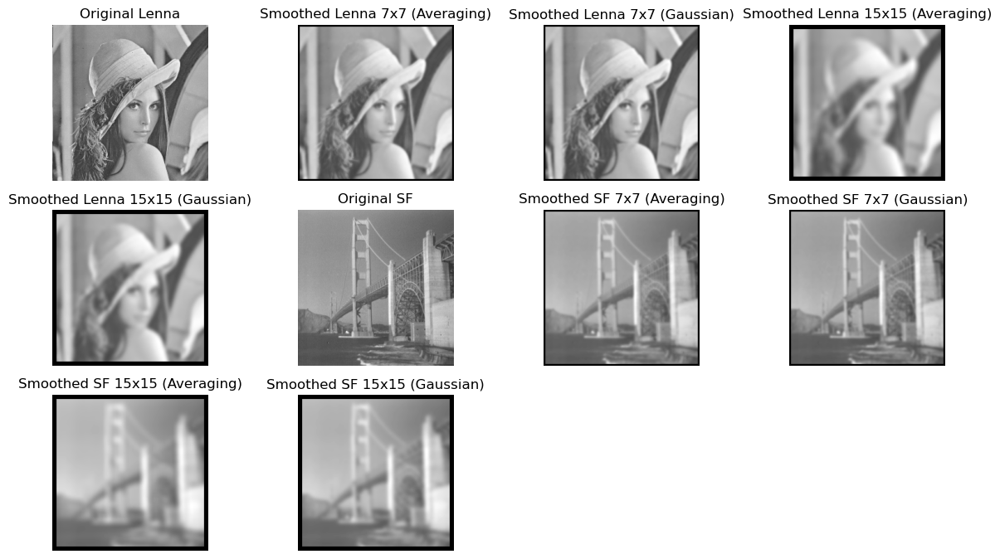

In [5]:
# Load the required libraries
import matplotlib.pyplot as plt

# Create a figure to display the images
plt.figure(figsize=(12, 18))

# Original Lenna Image
plt.subplot(8, 4, 1)
plt.imshow(reshape_to_2d(lenna_pixels, lenna_width, lenna_height), cmap='gray')
plt.title('Original Lenna')
plt.axis('off')

# Smoothed Lenna 7x7 (Averaging)
plt.subplot(8, 4, 2)
plt.imshow(smoothed_lenna_7x7, cmap='gray')
plt.title('Smoothed Lenna 7x7 (Averaging)')
plt.axis('off')

# Smoothed Lenna 7x7 (Gaussian)
plt.subplot(8, 4, 3)
plt.imshow(smoothed_lenna_gaussian_7x7, cmap='gray')
plt.title('Smoothed Lenna 7x7 (Gaussian)')
plt.axis('off')

# Smoothed Lenna 15x15 (Averaging)
plt.subplot(8, 4, 4)
plt.imshow(smoothed_lenna_15x15, cmap='gray')
plt.title('Smoothed Lenna 15x15 (Averaging)')
plt.axis('off')

# Smoothed Lenna 15x15 (Gaussian)
plt.subplot(8, 4, 5)
plt.imshow(smoothed_lenna_gaussian_15x15, cmap='gray')
plt.title('Smoothed Lenna 15x15 (Gaussian)')
plt.axis('off')

# Original SF Image
plt.subplot(8, 4, 6)
plt.imshow(reshape_to_2d(sf_pixels, sf_width, sf_height), cmap='gray')
plt.title('Original SF')
plt.axis('off')

# Smoothed SF 7x7 (Averaging)
plt.subplot(8, 4, 7)
plt.imshow(smoothed_sf_7x7, cmap='gray')
plt.title('Smoothed SF 7x7 (Averaging)')
plt.axis('off')

# Smoothed SF 7x7 (Gaussian)
plt.subplot(8, 4, 8)
plt.imshow(smoothed_sf_gaussian_7x7, cmap='gray')
plt.title('Smoothed SF 7x7 (Gaussian)')
plt.axis('off')

# Smoothed SF 15x15 (Averaging)
plt.subplot(8, 4, 9)
plt.imshow(smoothed_sf_15x15, cmap='gray')
plt.title('Smoothed SF 15x15 (Averaging)')
plt.axis('off')

# Smoothed SF 15x15 (Gaussian)
plt.subplot(8, 4, 10)
plt.imshow(smoothed_sf_gaussian_15x15, cmap='gray')
plt.title('Smoothed SF 15x15 (Gaussian)')
plt.axis('off')

# Ensure proper layout and display the figure
plt.tight_layout()
plt.show()

**3.Median Filtering**

(a) Implement median filtering; the size of the filter should be a parameter.

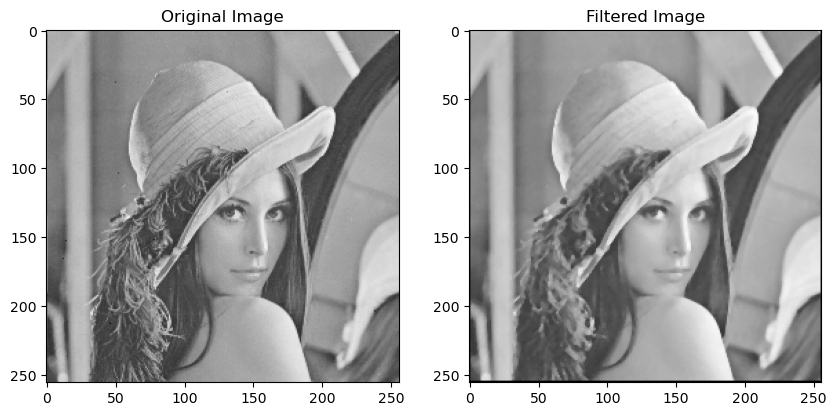

In [6]:
# Load the required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def median_filter(image, filter_size):
    # Ensure the filter size is odd
    if filter_size % 2 == 0:
        raise ValueError("Filter size must be odd")

    # Get the dimensions of the input image
    height, width = image.shape

    # Create an output image with the same dimensions
    filtered_image = [[0] * width for _ in range(height)]

    # Half of the filter size (used for neighborhood calculation)
    half_size = filter_size // 2

    # Loop through the image pixels
    for y in range(half_size, height - half_size):
        for x in range(half_size, width - half_size):
            # Extract the neighborhood of the current pixel
            neighborhood = [image[i][j] for i in range(y - half_size, y + half_size + 1) for j in range(x - half_size, x + half_size + 1)]

            # Calculate the median value for the neighborhood
            median_value = sorted(neighborhood)[len(neighborhood) // 2]

            # Set the median value as the pixel value in the output image
            filtered_image[y][x] = median_value

    return filtered_image

# Load a grayscale image using Matplotlib
input_image = mpimg.imread('lenna.pgm')

# Define the filter size (e.g., 3x3, 5x5, 7x7)
filter_size = 3

# Apply median filtering
output_image = median_filter(input_image, filter_size)

# Display the original and filtered images using Matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(output_image, cmap='gray')
plt.title("Filtered Image")

plt.show()


(b) Take the “lenna” and “boat” images and corrupt them with “salt and pepper” noise (i.e., randomly change X% of the pixels values to either black or white; for each image, use X=30 and X=50)

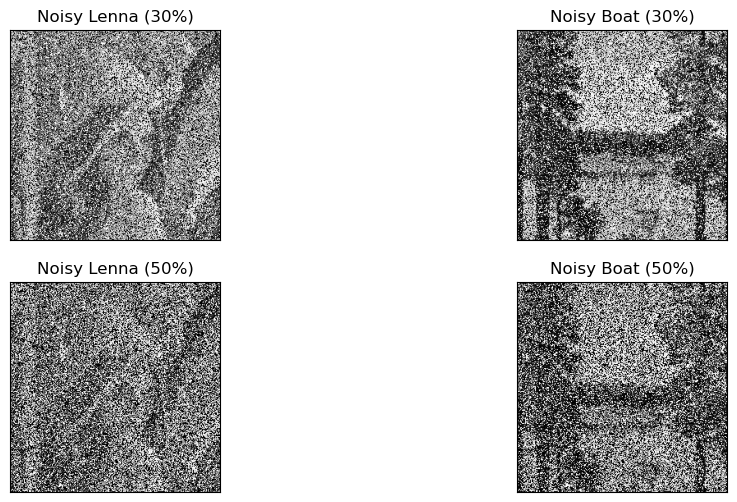

In [7]:
# Load the required libraries
import cv2
import matplotlib.pyplot as plt

# Function to add salt and pepper noise to an image
def add_salt_and_pepper_noise(image, percentage):
    noisy_image = image.copy()
    num_pixels = int((percentage / 100) * image.size)

    image_width, image_height = image.shape[1], image.shape[0]

    # Add salt noise (convert to white)
    for _ in range(num_pixels):
        x = hash(str(_)) % image_width
        y = hash(str(_ * 2)) % image_height
        noisy_image[y, x] = 255

    # Add pepper noise (convert to black)
    for _ in range(num_pixels):
        x = hash(str(_ * 3)) % image_width
        y = hash(str(_ * 4)) % image_height
        noisy_image[y, x] = 0

    return noisy_image

# Load the original "lenna" and "boat" images
lenna_image = cv2.imread('lenna.pgm', cv2.IMREAD_GRAYSCALE)
boat_image = cv2.imread('boat.pgm', cv2.IMREAD_GRAYSCALE)

# Define the percentage of noise (X=30 and X=50)
noise_percentage_30 = 30
noise_percentage_50 = 50

# Add salt and pepper noise to the images
noisy_lenna_30 = add_salt_and_pepper_noise(lenna_image, noise_percentage_30)
noisy_boat_30 = add_salt_and_pepper_noise(boat_image, noise_percentage_30)

noisy_lenna_50 = add_salt_and_pepper_noise(lenna_image, noise_percentage_50)
noisy_boat_50 = add_salt_and_pepper_noise(boat_image, noise_percentage_50)

# Save the noisy images
cv2.imwrite('noisy_lenna_30.pgm', noisy_lenna_30)
cv2.imwrite('noisy_boat_30.pgm', noisy_boat_30)
cv2.imwrite('noisy_lenna_50.pgm', noisy_lenna_50)
cv2.imwrite('noisy_boat_50.pgm', noisy_boat_50)

# Display the noisy images using matplotlib
plt.figure(figsize=(12, 6))
plt.subplot(221), plt.imshow(noisy_lenna_30, cmap='gray')
plt.title('Noisy Lenna (30%)'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(noisy_boat_30, cmap='gray')
plt.title('Noisy Boat (30%)'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(noisy_lenna_50, cmap='gray')
plt.title('Noisy Lenna (50%)'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(noisy_boat_50, cmap='gray')
plt.title('Noisy Boat (50%)'), plt.xticks([]), plt.yticks([])

plt.show()


(c) Apply median filtering to each of the corrupted images. For comparison purposes, apply averaging too. Try two different mask sizes for each case: 7 x 7 and 15 x 15.

(d) Show and discuss your results for both median filtering and averaging.

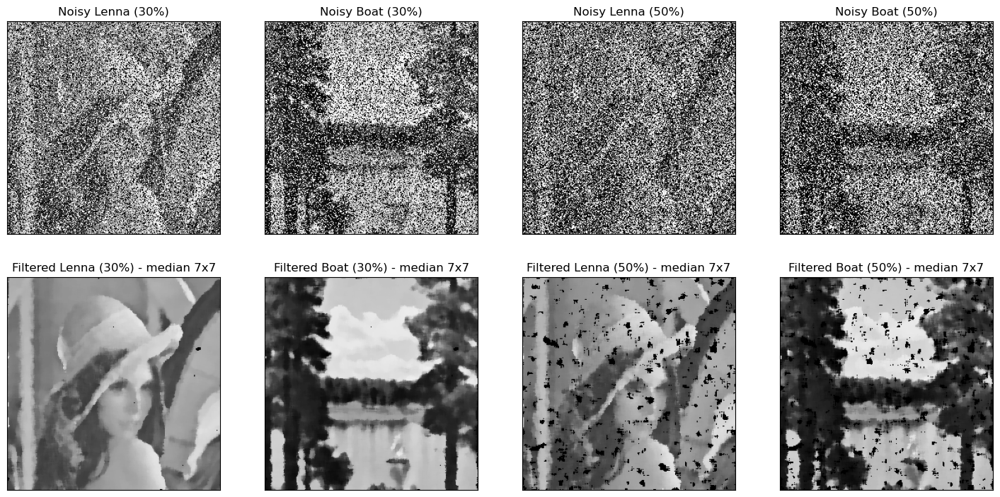

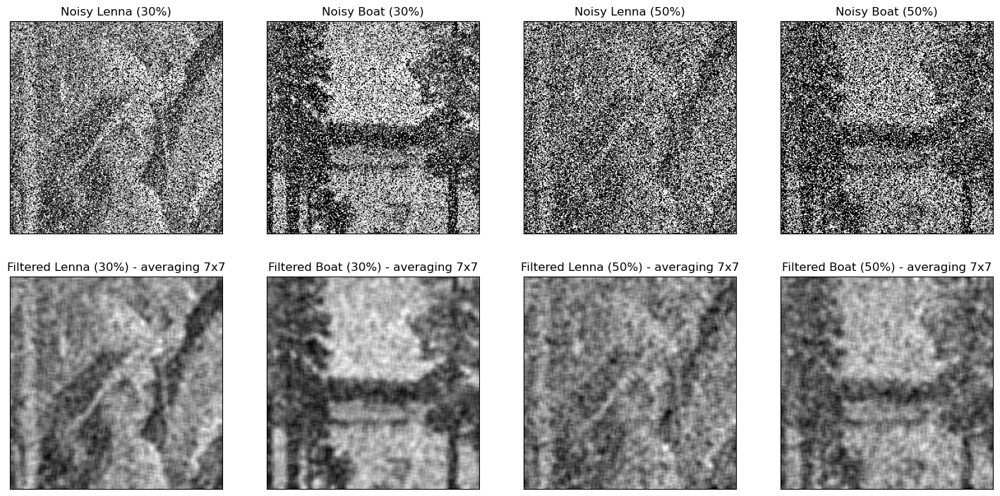

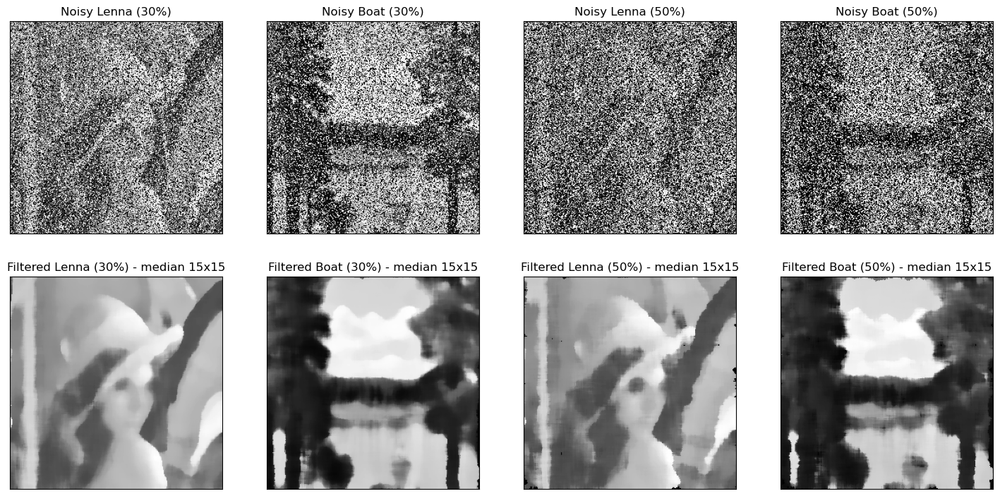

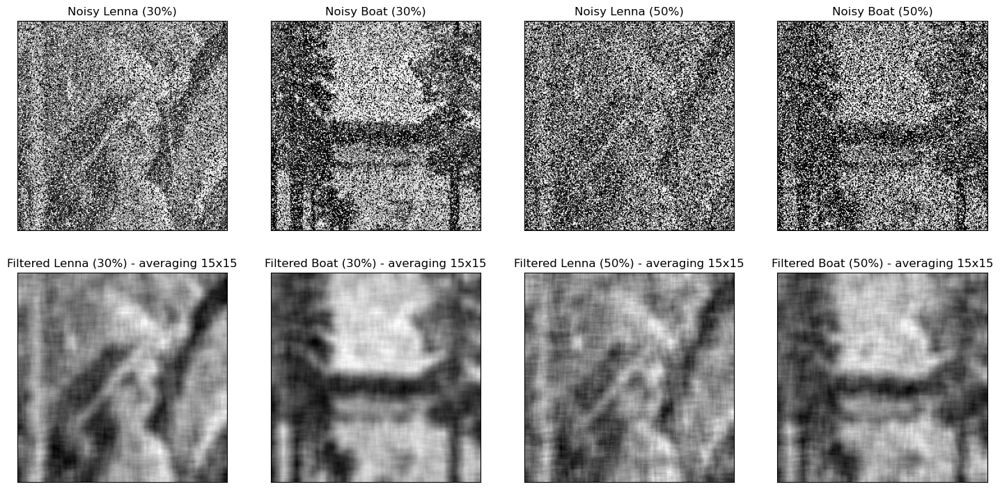

In [8]:
# Part c
# Import the required libraries
import cv2
import matplotlib.pyplot as plt

# Function to apply median and averaging filtering
def apply_filters(image, filter_size, filter_type):
    if filter_type == 'median':
        return cv2.medianBlur(image, filter_size)
    elif filter_type == 'averaging':
        return cv2.blur(image, (filter_size, filter_size))
    else:
        raise ValueError("Invalid filter type")

# Load the noisy images
noisy_lenna_30 = cv2.imread('noisy_lenna_30.pgm', cv2.IMREAD_GRAYSCALE)
noisy_boat_30 = cv2.imread('noisy_boat_30.pgm', cv2.IMREAD_GRAYSCALE)
noisy_lenna_50 = cv2.imread('noisy_lenna_50.pgm', cv2.IMREAD_GRAYSCALE)
noisy_boat_50 = cv2.imread('noisy_boat_50.pgm', cv2.IMREAD_GRAYSCALE)

# Error check: Ensure that images are loaded successfully
if any(img is None for img in [noisy_lenna_30, noisy_boat_30, noisy_lenna_50, noisy_boat_50]):
    print("Error: Failed to load one or more noisy images.")
else:
    # Define filter sizes and types
    filter_sizes = [7, 15]
    filter_types = ['median', 'averaging']

    # Apply filtering to the images and display the results
    for size in filter_sizes:
        for ftype in filter_types:
            # Apply the filter to noisy Lenna (30%)
            filtered_lenna_30 = apply_filters(noisy_lenna_30, size, ftype)

            # Apply the filter to noisy Boat (30%)
            filtered_boat_30 = apply_filters(noisy_boat_30, size, ftype)

            # Apply the filter to noisy Lenna (50%)
            filtered_lenna_50 = apply_filters(noisy_lenna_50, size, ftype)

            # Apply the filter to noisy Boat (50%)
            filtered_boat_50 = apply_filters(noisy_boat_50, size, ftype)
# part D
            # Display the images
            plt.figure(figsize=(18, 18))
            plt.subplot(441), plt.imshow(noisy_lenna_30, cmap='gray')
            plt.title(f'Noisy Lenna (30%)'), plt.xticks([]), plt.yticks([])

            plt.subplot(442), plt.imshow(noisy_boat_30, cmap='gray')
            plt.title(f'Noisy Boat (30%)'), plt.xticks([]), plt.yticks([])

            plt.subplot(443), plt.imshow(noisy_lenna_50, cmap='gray')
            plt.title(f'Noisy Lenna (50%)'), plt.xticks([]), plt.yticks([])

            plt.subplot(444), plt.imshow(noisy_boat_50, cmap='gray')
            plt.title(f'Noisy Boat (50%)'), plt.xticks([]), plt.yticks([])

            plt.subplot(445), plt.imshow(filtered_lenna_30, cmap='gray')
            plt.title(f'Filtered Lenna (30%) - {ftype} {size}x{size}'), plt.xticks([]), plt.yticks([])

            plt.subplot(446), plt.imshow(filtered_boat_30, cmap='gray')
            plt.title(f'Filtered Boat (30%) - {ftype} {size}x{size}'), plt.xticks([]), plt.yticks([])

            plt.subplot(447), plt.imshow(filtered_lenna_50, cmap='gray')
            plt.title(f'Filtered Lenna (50%) - {ftype} {size}x{size}'), plt.xticks([]), plt.yticks([])

            plt.subplot(448), plt.imshow(filtered_boat_50, cmap='gray')
            plt.title(f'Filtered Boat (50%) - {ftype} {size}x{size}'), plt.xticks([]), plt.yticks([])

            plt.show()


**4.Unsharp Masking and High Boost Filtering**

(a) Implement unsharp masking (K=1) and high-boost filtering (K>1). For smoothing, use the 7x7 Gaussian mask.

In [9]:
# Load the required libraries
import matplotlib.pyplot as plt

# Function to load a PGM image
def load_pgm(filename):
    with open(filename, 'rb') as f:
        # Read and validate the PGM header
        header = f.readline().decode().strip()
        if header != 'P5':
            raise ValueError('Invalid PGM file format.')

        # Read and ignore the comments if any
        while True:
            line = f.readline().decode().strip()
            if not line.startswith('#'):
                break

        # Read image dimensions
        width, height = map(int, line.split())

        # Read maximum pixel value
        max_val = int(f.readline().decode().strip())

        # Read the binary pixel data
        pixels = list(f.read())

    return width, height, max_val, pixels

# Function to convert pixel data to a 2D list
def pixels_to_array(pixels, width, height):
    image = []
    for i in range(height):
        row = []
        for j in range(width):
            row.append(pixels[i * width + j])
        image.append(row)
    return image

# Function to apply Gaussian smoothing
def apply_gaussian_mask(image, mask):
    height = len(image)
    width = len(image[0])
    smoothed_image = [[0] * width for _ in range(height)]

    for i in range(height):
        for j in range(width):
            pixel_sum = 0
            for m in range(-3, 4):
                for n in range(-3, 4):
                    if 0 <= i + m < height and 0 <= j + n < width:
                        pixel_sum += image[i + m][j + n] * mask[m + 3][n + 3]
            smoothed_image[i][j] = pixel_sum

    return smoothed_image

# Function to perform unsharp masking
def unsharp_mask(image, blurred_image, alpha=1):
    height = len(image)
    width = len(image[0])
    masked_image = [[0] * width for _ in range(height)]

    for i in range(height):
        for j in range(width):
            masked_image[i][j] = image[i][j] + alpha * (image[i][j] - blurred_image[i][j])

    return masked_image

# Function to perform high-boost filtering
def high_boost_filter(image, blurred_image, alpha=1):
    height = len(image)
    width = len(image[0])
    filtered_image = [[0] * width for _ in range(height)]

    for i in range(height):
        for j in range(width):
            filtered_image[i][j] = image[i][j] + alpha * (image[i][j] - blurred_image[i][j])

    return filtered_image

# Load the "lenna.pgm" and "f_16.pgm" images (make sure they are in the same directory)
lenna_width, lenna_height, lenna_max_val, lenna_pixels = load_pgm("lenna.pgm")
f16_width, f16_height, f16_max_val, f16_pixels = load_pgm("f_16.pgm")

# Convert the pixel data to 2D arrays
lenna_array = pixels_to_array(lenna_pixels, lenna_width, lenna_height)
f16_array = pixels_to_array(f16_pixels, f16_width, f16_height)

# Define the 7x7 mask
mask_7x7 = [
    [1, 1, 2, 2, 2, 1, 1],
    [1, 2, 2, 4, 2, 2, 1],
    [2, 2, 4, 8, 4, 2, 2],
    [2, 4, 8, 16, 8, 4, 2],
    [2, 2, 4, 8, 4, 2, 2],
    [1, 2, 2, 4, 2, 2, 1],
    [1, 1, 2, 2, 2, 1, 1]
]

# Normalize the mask
mask_sum = sum(sum(row) for row in mask_7x7)
mask_7x7 = [[val / mask_sum for val in row] for row in mask_7x7]

# Apply Gaussian mask for smoothing
lenna_smoothed = apply_gaussian_mask(lenna_array, mask_7x7)
f16_smoothed = apply_gaussian_mask(f16_array, mask_7x7)

# Now, you can perform further processing or visualization on the smoothed images.


(b) Use the “lenna” and “f_16” images and perform unsharp masking and high-boost filtering. In the case of high-boost filtering experiment with different K values and choose the results that seems to be visually best.

In [10]:
# Perform unsharp masking (K=1)
alpha = 1  # Set the unsharp masking coefficient
unsharp_mask_lenna = unsharp_mask(lenna_array, lenna_smoothed, alpha)  # Apply unsharp masking to Lenna image
unsharp_mask_f16 = unsharp_mask(f16_array, f16_smoothed, alpha)  # Apply unsharp masking to F16 image

# Perform high-boost filtering
alpha_k2 = 2  # Set the high-boost filter coefficient (K=2)
alpha_k3 = 3  # Set the high-boost filter coefficient (K=3)
high_boost_k2_lenna = high_boost_filter(lenna_array, lenna_smoothed, alpha_k2)  # Apply high-boost filtering (K=2) to Lenna image
high_boost_k3_lenna = high_boost_filter(lenna_array, lenna_smoothed, alpha_k3)  # Apply high-boost filtering (K=3) to Lenna image
high_boost_k2_f16 = high_boost_filter(f16_array, f16_smoothed, alpha_k2)  # Apply high-boost filtering (K=2) to F16 image
high_boost_k3_f16 = high_boost_filter(f16_array, f16_smoothed, alpha_k3)  # Apply high-boost filtering (K=3) to F16 image


(c) Show and discuss your results for both unsharp masking and high-boost filtering.

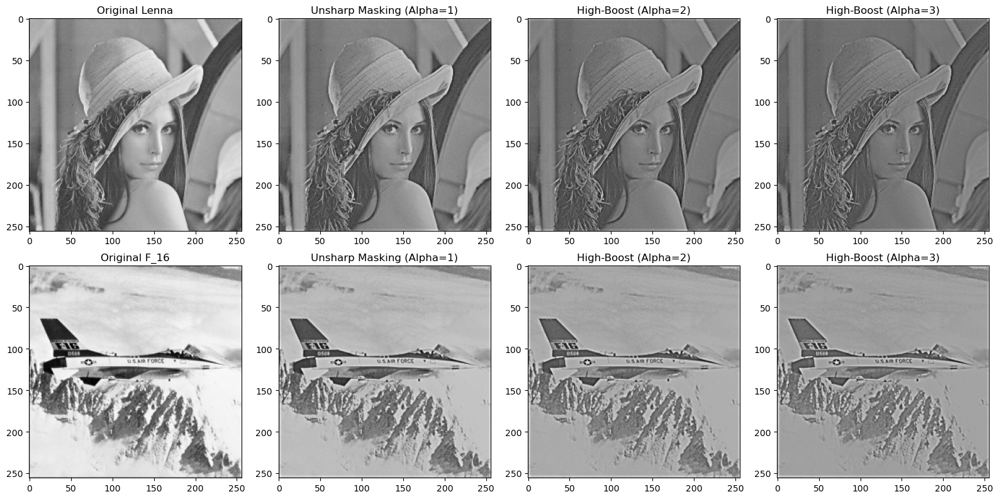

In [11]:
# Create a figure to display the processed images
plt.figure(figsize=(16, 8))

# Original Lenna Image
plt.subplot(2, 4, 1)
plt.imshow(lenna_array, cmap='gray')
plt.title("Original Lenna")

# Unsharp Masking (Alpha = 1) for Lenna
plt.subplot(2, 4, 2)
plt.imshow(unsharp_mask_lenna, cmap='gray')
plt.title(f"Unsharp Masking (Alpha={alpha})")

# High-Boost Filtering (K=2) for Lenna
plt.subplot(2, 4, 3)
plt.imshow(high_boost_k2_lenna, cmap='gray')
plt.title(f"High-Boost (Alpha={alpha_k2})")

# High-Boost Filtering (K=3) for Lenna
plt.subplot(2, 4, 4)
plt.imshow(high_boost_k3_lenna, cmap='gray')
plt.title(f"High-Boost (Alpha={alpha_k3})")

# Original F_16 Image
plt.subplot(2, 4, 5)
plt.imshow(f16_array, cmap='gray')
plt.title("Original F_16")

# Unsharp Masking (Alpha = 1) for F_16
plt.subplot(2, 4, 6)
plt.imshow(unsharp_mask_f16, cmap='gray')
plt.title(f"Unsharp Masking (Alpha={alpha})")

# High-Boost Filtering (K=2) for F_16
plt.subplot(2, 4, 7)
plt.imshow(high_boost_k2_f16, cmap='gray')
plt.title(f"High-Boost (Alpha={alpha_k2})")

# High-Boost Filtering (K=3) for F_16
plt.subplot(2, 4, 8)
plt.imshow(high_boost_k3_f16, cmap='gray')
plt.title(f"High-Boost (Alpha={alpha_k3})")

# Ensure proper layout and display the figure
plt.tight_layout()
plt.show()


**5.Gradient and Laplacian**

(a) Sharpen the “lenna” and “sf” images using the Prewitt Sobel, and Laplacian masks shown below.

In [12]:
# Function to load a PGM image
def load_pgm(filename):
    with open(filename, 'rb') as f:
        # Read and validate the PGM header
        header = f.readline().decode().strip()
        if header != 'P5':
            raise ValueError('Invalid PGM file format.')

        # Read and ignore the comments if any
        while True:
            line = f.readline().decode().strip()
            if not line.startswith('#'):
                break

        # Read image dimensions
        width, height = map(int, line.split())

        # Read maximum pixel value
        max_val = int(f.readline().decode().strip())

        # Read the binary pixel data
        pixels = bytearray(f.read())

    return width, height, max_val, pixels

# Load PGM images using the provided function
lenna_width, lenna_height, lenna_max_val, lenna_pixels = load_pgm('lenna.pgm')
sf_width, sf_height, sf_max_val, sf_pixels = load_pgm('sf.pgm')

# Define Prewitt masks for x and y directions
prewitt_x = [[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]
prewitt_y = [[-1, -1, -1], [0, 0, 0], [1, 1, 1]]

# Define Sobel masks for x and y directions
sobel_x = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]
sobel_y = [[-1, -2, -1], [0, 0, 0], [1, 2, 1]]

# Define Laplacian mask
laplacian_kernel = [[0, 1, 0], [1, -4, 1], [0, 1, 0]]

# Apply 2D filter
def filter2d(image, kernel):
    height, width = len(image), len(image[0])
    kernel_height, kernel_width = len(kernel), len(kernel[0])
    result = [[0] * width for _ in range(height)]
    
    for i in range(height):
        for j in range(width):
            total = 0
            for m in range(kernel_height):
                for n in range(kernel_width):
                    ii = i - kernel_height // 2 + m
                    jj = j - kernel_width // 2 + n
                    if 0 <= ii < height and 0 <= jj < width:
                        total += image[ii][jj] * kernel[m][n]
            result[i][j] = total
    
    return result

# Function to calculate gradient magnitude
def gradient_magnitude(dx, dy):
    height, width = len(dx), len(dx[0])
    result = [[0] * width for _ in range(height)]
    
    for i in range(height):
        for j in range(width):
            dx_val = dx[i][j]
            dy_val = dy[i][j]
            magnitude = abs(dx_val) + abs(dy_val)
            result[i][j] = magnitude  
    return result

# Function to apply Laplacian mask
def apply_laplacian(image, kernel, threshold=100):
    height, width = len(image), len(image[0])
    kernel_height, kernel_width = len(kernel), len(kernel[0])
    result = [[0] * width for _ in range(height)]
    
    for i in range(height):
        for j in range(width):
            total = 0
            for m in range(kernel_height):
                for n in range(kernel_width):
                    ii = i - kernel_height // 2 + m
                    jj = j - kernel_width // 2 + n
                    if 0 <= ii < height and 0 <= jj < width:
                        total += image[ii][jj] * kernel[m][n]
            result[i][j] = min(max(total, 0), threshold)
    
    return result

# Convert pixel data to 2D arrays
lenna_image = [[lenna_pixels[i * lenna_width + j] for j in range(lenna_width)] for i in range(lenna_height)]
sf_image = [[sf_pixels[i * sf_width + j] for j in range(sf_width)] for i in range(sf_height)]

# Apply Prewitt masks for x and y directions
lenna_prewitt_x = filter2d(lenna_image, prewitt_x)
lenna_prewitt_y = filter2d(lenna_image, prewitt_y)
sf_prewitt_x = filter2d(sf_image, prewitt_x)
sf_prewitt_y = filter2d(sf_image, prewitt_y)

# Apply Sobel masks for x and y directions
lenna_sobel_x = filter2d(lenna_image, sobel_x)
lenna_sobel_y = filter2d(lenna_image, sobel_y)
sf_sobel_x = filter2d(sf_image, sobel_x)
sf_sobel_y = filter2d(sf_image, sobel_y)

# Calculate gradient magnitude using Prewitt and Sobel
lenna_prewitt_magnitude = gradient_magnitude(lenna_prewitt_x, lenna_prewitt_y)
sf_prewitt_magnitude = gradient_magnitude(sf_prewitt_x, sf_prewitt_y)
lenna_sobel_magnitude = gradient_magnitude(lenna_sobel_x, lenna_sobel_y)
sf_sobel_magnitude = gradient_magnitude(sf_sobel_x, sf_sobel_y)

# Apply Laplacian filter
lenna_laplacian = apply_laplacian(lenna_image, laplacian_kernel)
sf_laplacian = apply_laplacian(sf_image, laplacian_kernel)


(b) Show and discuss your results in each case. Note that in the case of the Prewitt and Sobel masks, you need to show (i.e., visualize as images) both the “gradient magnitude” as well as the partial derivatives in the x- and y-direction.

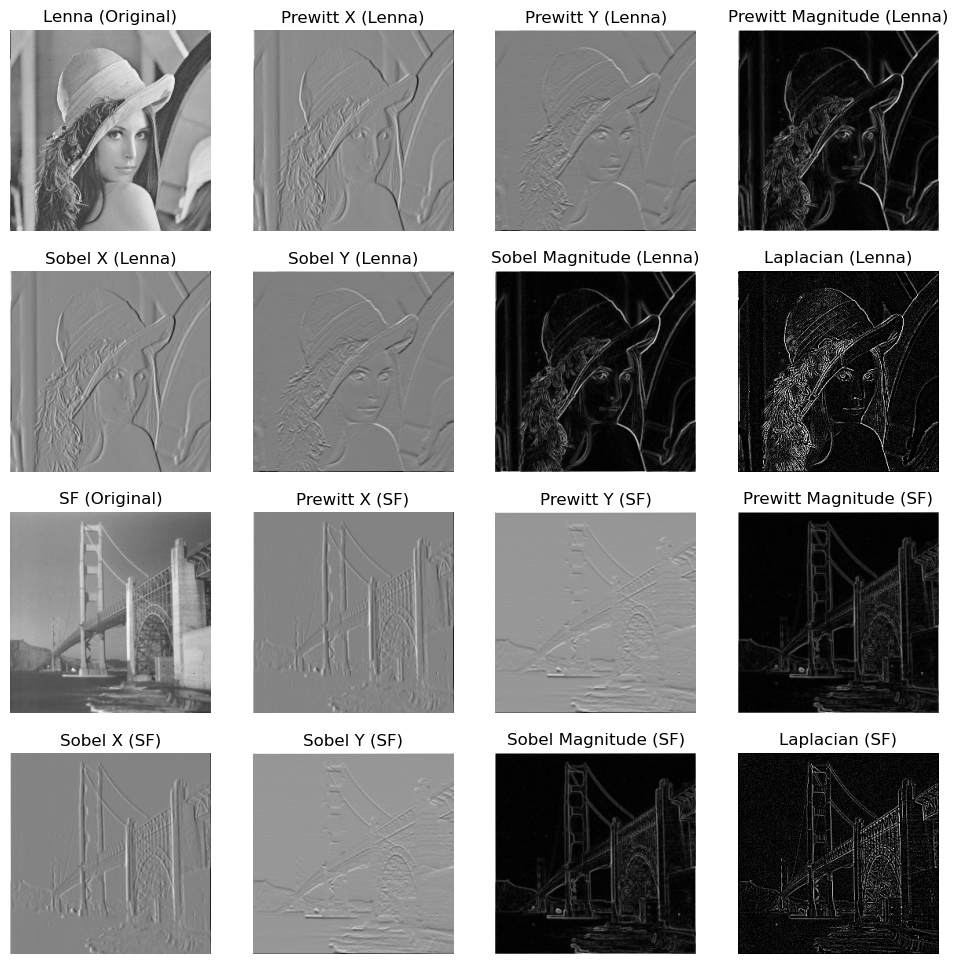

In [13]:
# Import the required libraries
import matplotlib.pyplot as plt

# Create a figure for displaying images
plt.figure(figsize=(12, 12))

# Original Lenna image
plt.subplot(4, 4, 1)
plt.imshow(lenna_image, cmap='gray')
plt.title('Lenna (Original)')
plt.axis('off')

# Lenna image after applying Prewitt filter in the X direction
plt.subplot(4, 4, 2)
plt.imshow(lenna_prewitt_x, cmap='gray')
plt.title('Prewitt X (Lenna)')
plt.axis('off')

# Lenna image after applying Prewitt filter in the Y direction
plt.subplot(4, 4, 3)
plt.imshow(lenna_prewitt_y, cmap='gray')
plt.title('Prewitt Y (Lenna)')
plt.axis('off')

# Magnitude of gradients after applying Prewitt filter
plt.subplot(4, 4, 4)
plt.imshow(lenna_prewitt_magnitude, cmap='gray')
plt.title('Prewitt Magnitude (Lenna)')
plt.axis('off')

# Lenna image after applying Sobel filter in the X direction
plt.subplot(4, 4, 5)
plt.imshow(lenna_sobel_x, cmap='gray')
plt.title('Sobel X (Lenna)')
plt.axis('off')

# Lenna image after applying Sobel filter in the Y direction
plt.subplot(4, 4, 6)
plt.imshow(lenna_sobel_y, cmap='gray')
plt.title('Sobel Y (Lenna)')
plt.axis('off')

# Magnitude of gradients after applying Sobel filter
plt.subplot(4, 4, 7)
plt.imshow(lenna_sobel_magnitude, cmap='gray')
plt.title('Sobel Magnitude (Lenna)')
plt.axis('off')

# Lenna image after applying Laplacian filter
plt.subplot(4, 4, 8)
plt.imshow(lenna_laplacian, cmap='gray')
plt.title('Laplacian (Lenna)')
plt.axis('off')

# Original SF image
plt.subplot(4, 4, 9)
plt.imshow(sf_image, cmap='gray')
plt.title('SF (Original)')
plt.axis('off')

# SF image after applying Prewitt filter in the X direction
plt.subplot(4, 4, 10)
plt.imshow(sf_prewitt_x, cmap='gray')
plt.title('Prewitt X (SF)')
plt.axis('off')

# SF image after applying Prewitt filter in the Y direction
plt.subplot(4, 4, 11)
plt.imshow(sf_prewitt_y, cmap='gray')
plt.title('Prewitt Y (SF)')
plt.axis('off')

# Magnitude of gradients after applying Prewitt filter
plt.subplot(4, 4, 12)
plt.imshow(sf_prewitt_magnitude, cmap='gray')
plt.title('Prewitt Magnitude (SF)')
plt.axis('off')

# SF image after applying Sobel filter in the X direction
plt.subplot(4, 4, 13)
plt.imshow(sf_sobel_x, cmap='gray')
plt.title('Sobel X (SF)')
plt.axis('off')

# SF image after applying Sobel filter in the Y direction
plt.subplot(4, 4, 14)
plt.imshow(sf_sobel_y, cmap='gray')
plt.title('Sobel Y (SF)')
plt.axis('off')

# Magnitude of gradients after applying Sobel filter
plt.subplot(4, 4, 15)
plt.imshow(sf_sobel_magnitude, cmap='gray')
plt.title('Sobel Magnitude (SF)')
plt.axis('off')

# SF image after applying Laplacian filter
plt.subplot(4, 4, 16)
plt.imshow(sf_laplacian, cmap='gray')
plt.title('Laplacian (SF)')
plt.axis('off')

# Display the plotted images
plt.show()
